# CHAPTER 4
## WQD7002 (P2) 
## WQD170031

## Steps thought of, will need to write them in for chapter 3 of the full report.
<br>1. data understanding - to identify fields important to the analysis (data accuracy etc.)
<br>2. text preprocessing - first remove common word (use nltk?); then perform 1 hot encoding (depending on how data need to be preprocessed to use the association rule library)???
<br>3. market basket analysis - association rule analysis - use pre-written libraries or copy from the coder who wrote his own algo for association rule analysis?
<br>4. evaluation by benchmarking to other metrics - see if high lift or support correspond to high number of lenders lending for the loan (or high amount raised in the crowdfunding) (or lesser time taken to raise the loan)

In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [0]:
#try see if the code above stays the same next session
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
whos

Interactive namespace is empty.


In [0]:
!ls '/content/drive/My Drive/kiva data/from build.kiva.org/'

ls: cannot access '/content/drive/My Drive/kiva data/from build.kiva.org/': No such file or directory


In [0]:
my_folder = '/content/drive/My Drive/kiva data/from build.kiva.org/'

In [0]:
import pandas as pd
import numpy as np
import datetime

In [0]:
df=pd.read_csv(my_folder+'loans_v2.csv')

df[['POSTED_TIME','PLANNED_EXPIRATION_TIME','DISBURSE_TIME','RAISED_TIME','REPORT_DT']] = \
df[['POSTED_TIME','PLANNED_EXPIRATION_TIME','DISBURSE_TIME','RAISED_TIME','REPORT_DT']].apply(pd.to_datetime)

df[df.select_dtypes(include=['int']).columns]=df[df.select_dtypes(include=['int']).columns].apply(pd.to_numeric,downcast='unsigned')

df[df.select_dtypes(include=['float']).columns]=df[df.select_dtypes(include=['float']).columns].apply(pd.to_numeric,downcast='float')

df[['ORIGINAL_LANGUAGE','STATUS','ACTIVITY_NAME','SECTOR_NAME','COUNTRY_CODE','COUNTRY_NAME','CURRENCY_POLICY','CURRENCY','REPAYMENT_INTERVAL','DISTRIBUTION_MODEL']]=\
df[['ORIGINAL_LANGUAGE','STATUS','ACTIVITY_NAME','SECTOR_NAME','COUNTRY_CODE','COUNTRY_NAME','CURRENCY_POLICY','CURRENCY','REPAYMENT_INTERVAL','DISTRIBUTION_MODEL']].astype('category')

In [0]:
df.info()

In [0]:
import dask.dataframe as dd
df=dd.read_csv(my_folder+'loans_v2.csv')

In [0]:
df2018=pd.read_csv(my_folder+'loans_2018_v3.csv')
df2017=pd.read_csv(my_folder+'loans_2017_v3.csv')

In [0]:
df.columns

Index(['Unnamed: 0', 'LOAN_ID', 'LOAN_NAME', 'ORIGINAL_LANGUAGE',
       'DESCRIPTION', 'DESCRIPTION_TRANSLATED', 'FUNDED_AMOUNT', 'LOAN_AMOUNT',
       'STATUS', 'IMAGE_ID', 'VIDEO_ID', 'ACTIVITY_NAME', 'SECTOR_NAME',
       'LOAN_USE', 'COUNTRY_CODE', 'COUNTRY_NAME', 'TOWN_NAME',
       'CURRENCY_POLICY', 'CURRENCY_EXCHANGE_COVERAGE_RATE', 'CURRENCY',
       'PARTNER_ID', 'POSTED_TIME', 'PLANNED_EXPIRATION_TIME', 'DISBURSE_TIME',
       'RAISED_TIME', 'LENDER_TERM', 'NUM_LENDERS_TOTAL',
       'NUM_JOURNAL_ENTRIES', 'NUM_BULK_ENTRIES', 'TAGS', 'BORROWER_NAMES',
       'BORROWER_GENDERS', 'BORROWER_PICTURED', 'REPAYMENT_INTERVAL',
       'DISTRIBUTION_MODEL', 'DESC_TRANSLATED_WORDCOUNT', 'DESC_WORDCOUNT',
       'DESCRIPTION_NEW', 'DESC_NEW_WORDCOUNT', 'LOAN_USE_WORDCOUNT',
       'AVY_NAME_WORDCOUNT', 'N_DESC_TRANSLATED', 'N_DESC', 'N_DESC_NEW',
       'N_BORROWERS', 'N_BORROWERS2', 'GROUP_LOANS', 'N_F_BORROWERS',
       'N_M_BORROWERS', 'HAVE_PICTURE', 'HAVE_VIDEO', 'N_BORROWERS_PIC

In [0]:
df1718=df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)].copy()

In [0]:
df1718.groupby(['ORIGINAL_LANGUAGE'])['DESCRIPTION'].apply(lambda x: x.isnull().sum()/len(x)*100)
df1718.groupby(['ORIGINAL_LANGUAGE'])['DESCRIPTION_TRANSLATED'].apply(lambda x: x.isnull().sum()/len(x)*100)
#df.groupby('var')['loyal_date'].apply(lambda x: x.notnull().sum()/len(x)*100)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in long_scalars
  """Entry point for launching an IPython kernel.


ORIGINAL_LANGUAGE
Arabic        NaN
English       0.0
French        0.0
Indonesian    NaN
Portuguese    0.0
Russian       0.0
Spanish       0.0
Vietnamese    NaN
Name: DESCRIPTION, dtype: float64

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in long_scalars
  


ORIGINAL_LANGUAGE
Arabic             NaN
English       0.000890
French        0.004704
Indonesian         NaN
Portuguese    0.000000
Russian       0.000000
Spanish       0.000000
Vietnamese         NaN
Name: DESCRIPTION_TRANSLATED, dtype: float64

### move these EDAs into another program later.

In [0]:
df1718.groupby(['STATUS'])['RAISED_TIME'].apply(lambda x: x.isnull().sum()/len(x)*100)

STATUS
expired        100.000000
fundRaising    100.000000
funded           0.000000
refunded        52.873563
Name: RAISED_TIME, dtype: float64

In [0]:
df1718[['ORIGINAL_LANGUAGE','DESCRIPTION','DESCRIPTION_TRANSLATED','DESCRIPTION_NEW']][df1718['ORIGINAL_LANGUAGE']!='English'].head(10)

,ORIGINAL_LANGUAGE,DESCRIPTION,DESCRIPTION_TRANSLATED,DESCRIPTION_NEW
27,Russian,ÐÐ¸ÑÐ°Ð»Ð¸Ð¹ Ð¿ÑÐ¾Ð¶Ð¸Ð²Ð°ÐµÑ Ð² Ð³Ð¾ÑÐ¾Ð...,Vitaliy lives in the city of Melitopol. He is ...,Vitaliy lives in the city of Melitopol. He is ...
30,Spanish,"Meguelina tiene 62 aÃ±os, es casada, sus hijos...",Meguelina is 62 years old. She is married. Her...,Meguelina is 62 years old. She is married. Her...
31,Spanish,La socia Maria Elizabeth pertenece al banco ci...,The member Maria Elizabeth belongs to the comm...,The member Maria Elizabeth belongs to the comm...
40,Spanish,Eduin es un hombre de 41 aÃ±os de edad el cual...,Eduin is a 41-year-old man who works raising p...,Eduin is a 41-year-old man who works raising p...
50,Spanish,"Maura, estÃ¡ separada, tiene dos hijos que est...",Maura is separated. She has two children who a...,Maura is separated. She has two children who a...
61,French,"Madame NOELLA, est prÃ©sidente de la banque co...",Madame Noella is the president of the communit...,Madame Noella is the president of the communit...
62,Spanish,El grupo llamado San Miguel estÃ¡ trabajando d...,The group called San Miguel is working togethe...,The group called San Miguel is working togethe...
66,Spanish,"DoÃ±a Elvia es una excelente trabajadora, sinc...",Elvia is an excellent worker. She is sincere ...,Elvia is an excellent worker. She is sincere ...
72,Russian,Ð¥Ð°Ð±Ð¸Ð±Ð° Ð´Ð¾Ð±ÑÐ°Ñ Ð¸ Ð¾ÑÐ·ÑÐ²ÑÐ¸Ð²...,Habiba is a kind and sympathetic young woman a...,Habiba is a kind and sympathetic young woman a...
103,Spanish,Jose Roberto es un joven soltero de 24 aÃ±os d...,"Jose Roberto is a single young man, 24 years o...","Jose Roberto is a single young man, 24 years o..."


In [0]:
df1718['N_DESC'].value_counts().reset_index(name='freq').rename(columns={'index':'N_REPEAT_DESC'}).sort_values(by='N_REPEAT_DESC').to_excel(my_folder+'1718 repeated description.xlsx')

In [0]:
df1718.groupby('STATUS')[['FUNDED_AMOUNT','LOAN_AMOUNT']].corr()

FUNDED_AMOUNT  LOAN_AMOUNT
STATUS                                               
expired     FUNDED_AMOUNT       1.000000     0.731423
            LOAN_AMOUNT         0.731423     1.000000
fundRaising FUNDED_AMOUNT       1.000000     0.971897
            LOAN_AMOUNT         0.971897     1.000000
funded      FUNDED_AMOUNT       1.000000     1.000000
            LOAN_AMOUNT         1.000000     1.000000
refunded    FUNDED_AMOUNT       1.000000     0.231861
            LOAN_AMOUNT         0.231861     1.000000

## Load dataset

### study how can further reduce the amount of data used when defining the pandas dataframe, 
<br>also to make the analysis easier to read when using certain functions like describe etc.
<br>for 2nd part, consider reading https://www.dataquest.io/blog/pandas-big-data/

In [0]:
#generate table to determine what is inside the df
#might wanna put this in a definition so that can call it again and again
tmp=df.isnull().sum().reset_index(name='n_miss').rename({'index':'variable'},axis=1) #calculate number of missing values
tmp2=df.notnull().sum().reset_index(name='n_notmiss').rename({'index':'variable'},axis=1) #calculate number of non-missing values, https://stackoverflow.com/questions/47044183/count-non-null-values-in-pandas
tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable') #join the tables so that can recycle variable name
tmp['n']=tmp['n_miss']+tmp['n_notmiss']
tmp2=df.nunique().reset_index(name='n_unique').rename({'index':'variable'},axis=1) #calculate number of unique values
tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
tmp['miss_rate']=tmp['n_miss']/tmp['n']
tmp['fill_rate']=tmp['n_notmiss']/tmp['n']
tmp['distinct_rate']=tmp['n_unique']/tmp['n']
tmp2=df.dtypes.reset_index(name='vartype').rename({'index':'variable'},axis=1) #get variable type
tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
#tmp.to_excel(my_folder+'dataset_overview_201119.xls')
tmp

,variable,n_miss,n_notmiss,n,n_unique,miss_rate,fill_rate,distinct_rate,vartype
0,LOAN_ID,0,1682790,1682790,1682790,0.000000,1.000000,1.000000,uint32
1,LOAN_NAME,48555,1634235,1682790,393776,0.028854,0.971146,0.234002,object
2,ORIGINAL_LANGUAGE,44209,1638581,1682790,8,0.026271,0.973729,0.000005,category
3,DESCRIPTION,44244,1638546,1682790,1634630,0.026292,0.973708,0.971381,object
4,DESCRIPTION_TRANSLATED,453635,1229155,1682790,1225355,0.269573,0.730427,0.728169,object
...,...,...,...,...,...,...,...,...,...
66,TAGS_CLEAN_PS_WORDCOUNT,0,1682790,1682790,79,0.000000,1.000000,0.000047,uint8
67,LOAN_USE_CLEAN_LM_WORDCOUNT,0,1682790,1682790,64,0.000000,1.000000,0.000038,uint8
68,LOAN_USE_CLEAN_PS_WORDCOUNT,0,1682790,1682790,64,0.000000,1.000000,0.000038,uint8
69,REPORT_DT,0,1682790,1682790,1531971,0.000000,1.000000,0.910376,"datetime64[ns, UTC]"


In [0]:
#store the processes above as a python function
def data_overview(data):
  tmp=data.isnull().sum().reset_index(name='n_miss').rename({'index':'variable'},axis=1) #calculate number of missing values
  tmp2=data.notnull().sum().reset_index(name='n_notmiss').rename({'index':'variable'},axis=1) #calculate number of non-missing values, https://stackoverflow.com/questions/47044183/count-non-null-values-in-pandas
  tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable') #join the tables so that can recycle variable name
  tmp['n']=tmp['n_miss']+tmp['n_notmiss']
  tmp2=data.nunique().reset_index(name='n_unique').rename({'index':'variable'},axis=1) #calculate number of unique values
  tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
  tmp['miss_rate']=tmp['n_miss']/tmp['n']
  tmp['fill_rate']=tmp['n_notmiss']/tmp['n']
  tmp['distinct_rate']=tmp['n_unique']/tmp['n']
  tmp2=data.dtypes.reset_index(name='vartype').rename({'index':'variable'},axis=1) #get variable type
  tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
  #tmp.to_excel(my_folder+'dataset_overview.xls')
  return tmp

## Charts to understand the datasets

### functions defined for plotting charts

In [0]:
#create a function to generate the plotly horizontal bar chart for frequencies of categorical variables
#https://stackoverflow.com/questions/35692781/python-plotting-percentage-in-seaborn-bar-plot
 
import plotly.graph_objects as go
import seaborn as sns
import plotly.express as px

def interactive_freqchart_h(data,variable):
   
   #generate frequency dataset
   tmp=data[variable].value_counts(normalize=True).\
   reset_index(name='freq').rename(mapper={'index':variable},axis=1)#.\
   #pipe((sns.barplot, "data"), x='freq', y='ORIGINAL_LANGUAGE', palette='ch:.25')
   
   tmp['freq']=tmp['freq']*100
   #sns.barplot(y='ORIGINAL_LANGUAGE',x='freq',data=tmp,order=tmp['ORIGINAL_LANGUAGE'])

   fig = go.Figure(go.Bar(
       x=tmp['freq'],
       y=tmp[variable],
       orientation='h'))
   fig.update_layout(
       title="Distribution of " + variable,
       xaxis_title="Frequency (in %)",
       yaxis_title=variable)
   fig.show()
   #fig.show(config={'editable': True,'scrollZoom': True,'displayModeBar': True})
   #'modeBarButtonsToRemove': ['toggleSpikelines','hoverCompareCartesian']

In [0]:
import plotly.graph_objects as go

def interactive_freqchart_v(data,variable):
   
   #generate frequency dataset
   tmp=data[variable].value_counts(normalize=True).\
   reset_index(name='freq').rename(mapper={'index':variable},axis=1)
   
   tmp['freq']=tmp['freq']*100

   fig = go.Figure(go.Bar(
       x=tmp[variable],
       y=tmp['freq']))
   fig.update_layout(
       title="Distribution of " + variable,
       xaxis_title=variable,
       yaxis_title="Frequency (in %)")
   fig.show()
   #fig.show(config={'editable': True,'scrollZoom': True,'displayModeBar': True})
   #'modeBarButtonsToRemove': ['toggleSpikelines','hoverCompareCartesian']

In [0]:
#plan to use boxplots later, https://plot.ly/python/box-plots/
import plotly.express as px
tips = px.data.tips()
fig = px.box(tips, x="time", y="total_bill")
fig.show()

## run the code below will need very high RAM

In [0]:
#from IPython.display import display, HTML
#RAM consuming so cannot use this, try explore an option from nltk, or remove stopwords first
df.DESCRIPTION_TRANSLATED.str.split(expand=True).stack().value_counts().to_frame().reset_index()#.\
#to_csv('/content/drive/My Drive/kiva data/check description field from loans file.csv')
#HTML(df3Desc.to_html())

## Step 3 - market basket analysis

try to use combination of loan_use, activity_name and sector name in this part?



In [0]:
from mlxtend.frequent_patterns import apriori, fpgrowth, fpmax, association_rules
#from mlxtend.frequent_patterns import association_rules

In [0]:
#only keep the important data needed.
#https://pandas.pydata.org/pandas-docs/stable/getting_started/comparison/comparison_with_sas.html, find 'keep'
df_new=df[['LOAN_ID','AVY_NAME_CLEAN_LEMMA','AVY_NAME_CLEAN_PS']].copy()

### try out apriori algorithm on activity name
then will get an idea how to interpret and how to alter the whole project while keeping to the context presented in first part of research project

In [0]:
df2017=pd.read_csv(my_folder+'loans_2017_v3.csv') #LOAD THE DATASET
df2018=pd.read_csv(my_folder+'loans_2018_v3.csv') #load the dataset used for testing...
#REMOVE EMPTY DESCRIPTION ROWS FROM THE DATASET

In [0]:
descnew_wordfreq2018=pd.read_excel(my_folder+'2018_descnew_lemma_wordfreq.xlsx')
descnew_wordfreq2017=pd.read_excel(my_folder+'2017_descnew_lemma_wordfreq.xlsx')
avynm_wordfreq=pd.read_excel(my_folder+'avy_name_lemma_wordfreq.xlsx')
loanuse_wordfreq=pd.read_excel(my_folder+'loan_use_lemma_wordfreq.xlsx')
wordfreq2017.shape
wordfreq2018.shape
avynm_wordfreq.shape
loanuse_wordfreq.shape
#can see from this file that the number of columns generated will be in the range of 130,000... 
#wil this cause prob?
#based on running the crosstab seems like it is a problem.... sobs.

(132034, 2)

(122958, 2)

(187, 2)

(50043, 2)

In [0]:
df2017[[col for col in df2017.columns if 'WORDCOUNT' in col]].describe().T
df2018[[col for col in df2018.columns if 'WORDCOUNT' in col]].describe().T

In [0]:
df2017['words'] = df2017.LOAN_USE_LM3.str.strip().str.split()#'[\W_]+')
df2017.head()
#arghhh.... loan use is not clean yet!!!
#actually used the wrong column just now lol

In [0]:
tmp = pd.DataFrame(df2017['LOAN_USE_LM3'].str.split().tolist(),\
                   index=df2017['LOAN_ID']).stack().\
                   reset_index(name='words').\
                   rename({'index':'LOAN_ID'},axis=1)
tmp.head()
tmp.shape

In [0]:
#split the text first into separate rows, so it will follow similar pattern to items in a basket at the market
#https://sigdelta.com/blog/text-analysis-in-pandas/ looks like this one might work like what izzuddin does?
#https://www.geeksforgeeks.org/python-pandas-split-strings-into-two-list-columns-using-str-split/

#this process is long, is there a way to simplify it
import datetime
start_time=datetime.datetime.now()

rows = []
for row in df2017[['LOAN_ID', 'words']].iterrows():
    r = row[1]
    #rows = [([i] for i in r)]
    for word in r.words:
        rows.append((r.LOAN_ID, word))

words = pd.DataFrame(rows, columns=['LOAN_ID', 'words'])
print("time taken:",datetime.datetime.now()-start_time)
words['qty']=1
words.shape
words.head()

In [0]:
basket_sets=pd.crosstab(words['LOAN_ID'],words['words'])

In [0]:
for col in basket_sets.columns:
  if basket_sets[col].max()>1:
    print(col,":",basket_sets[col].max())

In [0]:
basket_sets.to_csv(my_folder+'test using crosstab to gen basket set.xlsx')

In [0]:
words.to_csv(my_folder+'avy_name_lemma_basket.csv', index=False)

In [0]:
words=pd.read_csv(my_folder+'avy_name_lemma_basket.csv')

In [0]:
#basket_sets2=
words.groupby(['LOAN_ID','words'])['qty'].sum().unstack().reset_index().fillna(0).set_index('LOAN_ID').shape
#basket_sets2.head()

In [0]:
#FIP
#seems like 0.01 is too small that too much ram is consumed in the session
frequent_itemsets=apriori(basket_sets, min_support=0.012, use_colnames=True)
frequent_itemsets.head()

In [0]:
rules = association_rules(frequent_itemsets, metric='lift')#, min_treshold=1)
rules.sort_values(by='lift', ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
17,(selling),(fish),0.018818,0.018818,0.018818,1.000000,53.140177,0.018464,inf
16,(fish),(selling),0.018818,0.018818,0.018818,1.000000,53.140177,0.018464,inf
38,(high),"(education, cost)",0.020347,0.020347,0.020347,1.000000,49.146904,0.019933,inf
35,"(education, cost)",(high),0.020347,0.020347,0.020347,1.000000,49.146904,0.019933,inf
10,(education),(high),0.024932,0.020347,0.020347,0.816113,40.109403,0.019840,5.327458
36,"(high, cost)",(education),0.020347,0.024932,0.020347,1.000000,40.109403,0.019840,inf
11,(high),(education),0.020347,0.024932,0.020347,1.000000,40.109403,0.019840,inf
37,(education),"(high, cost)",0.024932,0.020347,0.020347,0.816113,40.109403,0.019840,5.327458
25,(vegetable),(fruit),0.025590,0.025590,0.025590,1.000000,39.077398,0.024935,inf
24,(fruit),(vegetable),0.025590,0.025590,0.025590,1.000000,39.077398,0.024935,inf


In [0]:
basket_sets.shape
frequent_itemsets.shape
rules.shape

(1682790, 187)

(54, 2)

(46, 9)

In [0]:
#try and see if the same occurs when using fpgrowth or fpmax?
frequent_itemsets=fpgrowth(basket_sets, min_support=0.012, use_colnames=True)
frequent_itemsets.head()

,support,itemsets
0,0.090759,(food)
1,0.045142,(productionsales)
2,0.098848,(sale)
3,0.014084,(animal)
4,0.054963,(clothing)


In [0]:
rules = association_rules(frequent_itemsets, metric='lift')#, min_treshold=1)
rules.sort_values(by='lift', ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
6,(fish),(selling),0.018818,0.018818,0.018818,1.000000,53.140177,0.018464,inf
7,(selling),(fish),0.018818,0.018818,0.018818,1.000000,53.140177,0.018464,inf
43,(high),"(education, cost)",0.020347,0.020347,0.020347,1.000000,49.146904,0.019933,inf
42,"(education, cost)",(high),0.020347,0.020347,0.020347,1.000000,49.146904,0.019933,inf
36,(high),(education),0.020347,0.024932,0.020347,1.000000,40.109403,0.019840,inf
37,(education),(high),0.024932,0.020347,0.020347,0.816113,40.109403,0.019840,5.327458
44,(education),"(high, cost)",0.024932,0.020347,0.020347,0.816113,40.109403,0.019840,5.327458
41,"(high, cost)",(education),0.020347,0.024932,0.020347,1.000000,40.109403,0.019840,inf
28,(fruit),(vegetable),0.025590,0.025590,0.025590,1.000000,39.077398,0.024935,inf
29,(vegetable),(fruit),0.025590,0.025590,0.025590,1.000000,39.077398,0.024935,inf


In [0]:
basket_sets.shape
frequent_itemsets.shape
rules.shape

(1682790, 187)

(54, 2)

(46, 9)

In [0]:
#encounter error so decide to drop the use of this
frequent_itemsets=fpmax(basket_sets, min_support=0.02, use_colnames=True)
frequent_itemsets.head()

In [0]:
rules = association_rules(frequent_itemsets, metric='lift')#, min_treshold=1)
rules.sort_values(by='lift', ascending=False)

In [0]:
basket_sets.shape
frequent_itemsets.shape
rules.shape

In [0]:
tmp=df2017.head(1)

### define a function for calculation the association rule learning algorithm

In [0]:
#preprocess to get the data to get the keywords for each loans in a basket form first
def keyword_basket(data, identifier_column, variable):
  data_new = data[[identifier_column,variable]].copy()
  data_new['words'] = data_new[variable].str.strip().str.split('[\W_]+')
  rows = []
  #identifier = []
  for row in data_new[[identifier_column, 'words']].itertuples():
    dictRow = row._asdict()
    #r = row[1]
    #rows = [[i] for i in r]
    for word in dictRow['words']:
        #identifier.append(dictRow[identifier_column])
        #rows.append(word)
        rows.append((dictRow[identifier_column], word))

  words = pd.DataFrame(rows, columns=[identifier_column, 'words'])
  #words['words']=rows
  words['qty']=1  #may want to change this to calculate number of the terms instead
  return words

In [0]:
def keyword_basket2(data, item_col, id_col):
  
  term_wordfreq=data[item_col].str.split(expand=True).stack().value_counts().\
                   reset_index(name='freq').rename({'index':item_col+'_term'},axis=1)
  
  freqtable=term_wordfreq['freq'].value_counts().reset_index(name='freq').rename({'index':'n_termfreq'},axis=1)
  freqtable['cum_freq'] = freqtable.loc[::-1, 'freq'].cumsum()[::-1]
  
  n=freqtable.loc[(freqtable['cum_freq']>=2900) & (tmp['cum_freq']<=3000),'n_termfreq'].max()

  words = pd.DataFrame(data[item_col].str.split().tolist(),\
                     index=data[id_col]).stack().\
                     reset_index(name='keywords').\
                     rename({'index':id_col},axis=1)


  words=pd.merge(words,term_wordfreq,how='left',left_on='keywords',right_on=item_col+'_term')
  words=words.drop(columns=['level_1',item_col+'_term'],axis=1)
  words=words[words['freq']>=n]
  return words

In [0]:
#encounter error here
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

In [0]:
#from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
#from mlxtend.frequent_patterns import fpmax
from mlxtend.frequent_patterns import association_rules

def ARM_code(data,identifier_column,variable,support=0.001, treshold=1):
  
  #preprocess to get the data in a basket form first
  words = keyword_basket(data,identifier_column,variable)

  #preprocess before using the FIP algorithms
  basket_sets = pd.crosstab(words[identifier_column],words['words'])
  #basket_sets = words.groupby([identifier_column,'words'])['qty'].sum().\
  #              unstack().reset_index().fillna(0).set_index(identifier_column)
  basket_sets = basket_sets.applymap(encode_units)

  #FIP algorithms
  #FI_apriori = apriori(basket_sets, min_support = support, use_colnames = True)
  FI_fpgrowth =  fpgrowth(basket_sets, min_support = support, use_colnames = True)
  #FI_fpmax = fpmax(basket_sets, min_support = support, use_colnames = True)

  #association rule mining from each FIP algorithms run
  #apriori_rules = association_rules(FI_apriori, metric = 'lift')#, min_treshold=treshold)
  fpgrowth_rules = association_rules(FI_fpgrowth, metric = 'lift')#, min_treshold=treshold)
  #fpmax_rules = association_rules(FI_fpmax, metric = 'lift')#, min_treshold=treshold)

  return fpgrowth_rules, FI_fpgrowth, basket_sets, words\
  #, apriori_rules, fpmax_rules, FI_apriori, FI_fpmax

In [0]:
#test whether code above works or not
frequent_itemsets, rules, basket_sets, words = \
apriori_code(data=df,identifier_column='LOAN_ID',variable='AVY_NAME_CLEAN_PS',support=0.012)

frequent_itemsets.head(10)
rules.head(10)
basket_sets.head(10)
words2.head(10)

### Generating the association rules

In [0]:
#df2017=pd.read_csv(my_folder+'loans_2017.csv')
df2017=pd.read_csv(my_folder+'loans_2017_v3.csv') #LOAD THE DATASET
df2018=pd.read_csv(my_folder+'loans_2018_v3.csv')

In [0]:
df2017.columns

Index(['LOAN_ID', 'LOAN_NAME', 'ORIGINAL_LANGUAGE', 'DESCRIPTION',
       'DESCRIPTION_TRANSLATED', 'FUNDED_AMOUNT', 'LOAN_AMOUNT', 'STATUS',
       'IMAGE_ID', 'VIDEO_ID', 'ACTIVITY_NAME', 'SECTOR_NAME', 'LOAN_USE',
       'COUNTRY_CODE', 'COUNTRY_NAME', 'TOWN_NAME', 'CURRENCY_POLICY',
       'CURRENCY_EXCHANGE_COVERAGE_RATE', 'CURRENCY', 'PARTNER_ID',
       'POSTED_TIME', 'PLANNED_EXPIRATION_TIME', 'DISBURSE_TIME',
       'RAISED_TIME', 'LENDER_TERM', 'NUM_LENDERS_TOTAL',
       'NUM_JOURNAL_ENTRIES', 'NUM_BULK_ENTRIES', 'TAGS', 'BORROWER_NAMES',
       'BORROWER_GENDERS', 'BORROWER_PICTURED', 'REPAYMENT_INTERVAL',
       'DISTRIBUTION_MODEL', 'DESC_TRANSLATED_WORDCOUNT', 'DESC_WORDCOUNT',
       'DESCRIPTION_NEW', 'DESC_NEW_WORDCOUNT', 'LOAN_USE_WORDCOUNT',
       'AVY_NAME_WORDCOUNT', 'N_DESC_TRANSLATED', 'N_DESC', 'N_DESC_NEW',
       'N_BORROWERS', 'N_BORROWERS2', 'GROUP_LOANS', 'N_F_BORROWERS',
       'N_M_BORROWERS', 'HAVE_PICTURE', 'HAVE_VIDEO', 'N_BORROWERS_PICTURED',
      

In [0]:
df2017.LOAN_USE_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().to_excel(my_folder+'17_loanuse_clean_lm_wordfreq_081219.xlsx')
df2018.LOAN_USE_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().to_excel(my_folder+'18_loanuse_clean_lm_wordfreq_081219.xlsx')

In [0]:
df2017[['DESC_NEW_CLEAN_LM_WORDCOUNT','DESC_NEW_CLEAN_PS_WORDCOUNT']].describe(percentiles=[.05,.25,.5,.75,.95]).T
df2018[['DESC_NEW_CLEAN_LM_WORDCOUNT','DESC_NEW_CLEAN_PS_WORDCOUNT']].describe(percentiles=[.05,.25,.5,.75,.95]).T

,count,mean,std,min,5%,25%,50%,75%,95%,max
DESC_NEW_CLEAN_LM_WORDCOUNT,196075.0,62.734341,23.62492,8.0,34.0,45.0,58.0,75.0,111.0,763.0
DESC_NEW_CLEAN_PS_WORDCOUNT,196075.0,62.734341,23.62492,8.0,34.0,45.0,58.0,75.0,111.0,763.0


,count,mean,std,min,5%,25%,50%,75%,95%,max
DESC_NEW_CLEAN_LM_WORDCOUNT,187917.0,64.474438,23.582154,12.0,35.0,47.0,60.0,78.0,111.0,243.0
DESC_NEW_CLEAN_PS_WORDCOUNT,187917.0,64.474438,23.582154,12.0,35.0,47.0,60.0,78.0,111.0,243.0


In [0]:
df2017[['LOAN_USE_CLEAN_LM_WORDCOUNT','LOAN_USE_CLEAN_PS_WORDCOUNT']].describe(percentiles=[.05,.25,.5,.75,.95]).T
df2018[['LOAN_USE_CLEAN_LM_WORDCOUNT','LOAN_USE_CLEAN_PS_WORDCOUNT']].describe(percentiles=[.05,.25,.5,.75,.95]).T

,count,mean,std,min,5%,25%,50%,75%,95%,max
LOAN_USE_CLEAN_LM_WORDCOUNT,196075.0,6.897753,3.211023,1.0,3.0,4.0,6.0,9.0,13.0,37.0
LOAN_USE_CLEAN_PS_WORDCOUNT,196075.0,6.897718,3.211005,1.0,3.0,4.0,6.0,9.0,13.0,37.0


,count,mean,std,min,5%,25%,50%,75%,95%,max
LOAN_USE_CLEAN_LM_WORDCOUNT,187917.0,7.426587,3.484058,0.0,3.0,5.0,7.0,9.0,14.0,35.0
LOAN_USE_CLEAN_PS_WORDCOUNT,187917.0,7.426571,3.484073,0.0,3.0,5.0,7.0,9.0,14.0,35.0


In [0]:
df2017.columns
df2018.columns

#### activity name

In [0]:
#2017
#first check if need to remove any additional terms. how? if n_rows > 3000.
df2017.AVY_NAME_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().\
reset_index(name='freq').shape#.rename({'index':'loan_use_term'},axis=1)

(186, 2)

In [0]:
#2017  - if prev cell is OK then proceed. if not need to use steps in 3.1

rules, frequent_itemsets, basket_sets, words = \
ARM_code(data=df2017,identifier_column='LOAN_ID',variable='AVY_NAME_CLEAN_LEMMA',support=0.01)

frequent_itemsets.to_csv(my_folder+'281119_17_FI_avynm_lm.csv', index=False)
rules.to_csv(my_folder+'281119_17_ARM_avynm_lm.csv', index=False)
basket_sets.to_csv(my_folder+'281119_17_basketset_avynm_lm.csv', index=False)

frequent_itemsets.shape#head(10)
rules.shape#head(10)
#basket_sets.shape#head(10)
#words.shape#head(10)

(69, 2)

(70, 9)

In [0]:
#2018
#first check if need to remove any additional terms. how? if n_rows > 3000.
df2018.AVY_NAME_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().\
reset_index(name='freq').shape#.rename({'index':'loan_use_term'},axis=1)

(187, 2)

In [0]:
#2018 - if prev cell is OK then proceed. if not need to use steps in 3.1

rules, frequent_itemsets, basket_sets, words = \
ARM_code(data=df2018,identifier_column='LOAN_ID',variable='AVY_NAME_CLEAN_LEMMA',support=0.01)

frequent_itemsets.to_csv(my_folder+'281119_18_FI_avynm_lm.csv', index=False)
rules.to_csv(my_folder+'281119_18_ARM_avynm_lm.csv', index=False)
basket_sets.to_csv(my_folder+'281119_18_basketset_avynm_lm.csv', index=False)

frequent_itemsets.shape#head(10)
rules.shape#head(10)
#basket_sets.shape#head(10)
#words.shape#head(10)

(68, 2)

(70, 9)

#### tags

In [0]:
#2017
#first check if need to remove any additional terms. how? if n_rows > 3000.
df2017.TAGS_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().\
reset_index(name='freq').shape#.rename({'index':'loan_use_term'},axis=1)

(53, 2)

In [0]:
#2017

rules, frequent_itemsets, basket_sets, words = \
ARM_code(data=df2017,identifier_column='LOAN_ID',variable='TAGS_CLEAN_LEMMA',support=0.01)

frequent_itemsets.to_csv(my_folder+'281119_17_FI_tags.csv', index=False)
rules.to_csv(my_folder+'281119_17_ARM_tags.csv', index=False)
basket_sets.to_csv(my_folder+'281119_17_basketset_tags.csv', index=False)

frequent_itemsets.shape#head(10)
rules.shape#head(10)
#basket_sets.shape#head(10)
#words.shape#head(10)

(887, 2)

(10120, 9)

In [0]:
#2018
#first check if need to remove any additional terms. how? if n_rows > 3000.
df2018.TAGS_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().\
reset_index(name='freq').shape#.rename({'index':'loan_use_term'},axis=1)

(52, 2)

In [0]:
#2018 - if prev cell is OK then proceed. if not need to use steps in 3.1

rules, frequent_itemsets, basket_sets, words = \
ARM_code(data=df2018,identifier_column='LOAN_ID',variable='TAGS_CLEAN_LEMMA',support=0.01)

frequent_itemsets.to_csv(my_folder+'281119_18_FI_tags.csv', index=False)
rules.to_csv(my_folder+'281119_18_ARM_tags.csv', index=False)
basket_sets.to_csv(my_folder+'281119_18_basketset_tags.csv', index=False)

frequent_itemsets.shape#head(10)
rules.shape#head(10)
#basket_sets.shape#head(10)
#words.shape#head(10)

(876, 2)

(9602, 9)

In [0]:
frequent_itemsets.shape
rules.shape
basket_sets.shape
words.shape

(70, 2)

(72, 9)

(225476, 187)

(372868, 3)

In [0]:
rules['conviction'].describe().T

count    72.000000
mean           inf
std            NaN
min       1.147112
25%       2.701781
50%      88.687240
75%            inf
max            inf
Name: conviction, dtype: float64

### upgrading mlxtend

In [0]:
!pip install mlxtend --upgrade

     |████████████████████████████████| 1.3MB 2.8MB/s 
  Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0


In [0]:
import mlxtend
print(mlxtend.__version__)

0.17.0


## Step 3.1 reclean text data & generate basket 

### 2017

#### loan use processing

In [0]:
loanuse_wordfreq = df2017.LOAN_USE_LM2.str.split(expand=True).stack().value_counts().\
                   reset_index(name='freq').rename({'index':'loan_use_term'},axis=1)
#loanuse_wordfreq.shape
#loanuse_wordfreq.head()
#.to_excel(my_folder+'desc_wordfreq.xlsx')

tmp=loanuse_wordfreq['freq'].value_counts().reset_index(name='freq').\
    rename({'index':'loan_use_wordfreq'},axis=1).sort_values(by='loan_use_wordfreq',axis=0)
tmp['cum_freq'] = tmp.loc[::-1, 'freq'].cumsum()[::-1]  #https://stackoverflow.com/questions/37872565/reversed-cumulative-sum-of-a-column-in-pandas-dataframe
n=tmp.loc[(tmp['cum_freq']>=2900) & (tmp['cum_freq']<=3000),'loan_use_wordfreq'].max()

words2017 = pd.DataFrame(df2017['LOAN_USE_LM2'].str.split().tolist(),\
                   index=df2017['LOAN_ID']).stack().\
                   reset_index(name='words').\
                   rename({'index':'LOAN_ID'},axis=1)

words2017=pd.merge(words2017,loanuse_wordfreq,how='left',left_on='words',right_on='loan_use_term')
words2017=words2017.drop(columns=['level_1','loan_use_term'],axis=1)
words2017=words2017[words2017['freq']>=n]

basket_sets_2017 = pd.crosstab(words2017['LOAN_ID'],words2017['words'])

words2017.head()
words2017.shape

,LOAN_ID,words,freq
0,1401164,purchase,44360
1,1401164,pig,6380
2,1401164,stock,11336
3,1401164,vegetable,5652
4,1401164,sale,4095


(1324141, 3)

In [0]:
for col in basket_sets_2017.columns:
  if basket_sets_2017[col].max()>1:
    print(col,":",basket_sets_2017[col].max())

In [0]:
#preprocess before using the FIP algorithms
basket_sets_2017 = basket_sets_2017.applymap(encode_units)

FI_fpgrowth_2017 =  fpgrowth(basket_sets_2017, min_support = 0.01, use_colnames = True)
fpgrowth_rules_2017 = association_rules(FI_fpgrowth_2017, metric = 'lift')#, min_treshold=treshold)

FI_fpgrowth_2017.to_csv(my_folder+'281119_17_FI_loanuse_lm2_v2.csv', index=False)
fpgrowth_rules_2017.to_csv(my_folder+'281119_17_ARM_loanuse_lm2_v2.csv', index=False)
basket_sets_2017.to_csv(my_folder+'281119_17_basketset_loanuse_lm2_v2.csv', index=False)

FI_fpgrowth_2017.shape#head(10)
fpgrowth_rules_2017.shape#head(10)
#basket_sets.head(10)
#words.head(10)

(729, 2)

(9384, 9)

In [0]:
test[test.select_dtypes(include=['int']).columns]=\
test[test.select_dtypes(include=['int']).columns].apply(pd.to_numeric,downcast='unsigned')

#### description_new processing


need huge RAM for this. after adjusting to 20% min support in a HPC will still need more than 20GB of RAM to execute.

In [0]:
start_time=datetime.datetime.now()

descnew_wordfreq = df2017.DESC_NEW_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().\
                   reset_index(name='freq').rename({'index':'descnew_term'},axis=1)
#oanuse_wordfreq.shape
#loanuse_wordfreq.head()
#.to_excel(my_folder+'desc_wordfreq.xlsx')

tmp=descnew_wordfreq['freq'].value_counts().reset_index(name='freq').\
    rename({'index':'descnew_wordfreq'},axis=1).sort_values(by='descnew_wordfreq',axis=0)
tmp['cum_freq'] = tmp.loc[::-1, 'freq'].cumsum()[::-1]  #https://stackoverflow.com/questions/37872565/reversed-cumulative-sum-of-a-column-in-pandas-dataframe
n=tmp.loc[(tmp['cum_freq']>=1900) & (tmp['cum_freq']<=2000),'descnew_wordfreq'].max()

desc2017 = pd.DataFrame(df2017['DESC_NEW_CLEAN_LEMMA'].str.split().tolist(),\
                   index=df2017['LOAN_ID']).stack().\
                   reset_index(name='words').\
                   rename({'index':'LOAN_ID'},axis=1)

desc2017=pd.merge(desc2017,descnew_wordfreq,how='left',left_on='words',right_on='descnew_term')
desc2017=desc2017.drop(columns=['level_1','descnew_term'],axis=1)
desc2017=desc2017[desc2017['freq']>=n]
desc2017['freq'].value_counts().reset_index(name='freq').shape#rename({'index':'descnew_wordfreq'},axis=1)

basket_sets_2017 = pd.crosstab(desc2017['LOAN_ID'],desc2017['words'])

print(datetime.datetime.now()-start_time)
#desc2017.head()
#desc2017.shape

KeyError: ignored

In [0]:
start_time=datetime.datetime.now()

#preprocess before using the FIP algorithms
basket_sets_2017 = basket_sets_2017.applymap(encode_units)

FI_fpgrowth_2017 =  fpgrowth(basket_sets_2017, min_support = 0.01, use_colnames = True)
fpgrowth_rules_2017 = association_rules(FI_fpgrowth_2017, metric = 'lift')#, min_treshold=treshold)

FI_fpgrowth_2017.to_csv(my_folder+'281119_17_FI_descnew_v2.csv', index=False)
fpgrowth_rules_2017.to_csv(my_folder+'281119_17_ARM_descnew_v2.csv', index=False)
basket_sets_2017.to_csv(my_folder+'281119_17_basketset_descnew_v2.csv', index=False)

print(datetime.datetime.now()-start_time)
FI_fpgrowth_2017.shape#head(10)
fpgrowth_rules_2017.shape#head(10)
#basket_sets_2017.head(10)
#words2017.head(10)

### 2018

#### loan use processing

In [0]:
#just use back 2017 words to reduce the not so frequent terms here.
words2018 = pd.DataFrame(df2018['LOAN_USE_LM2'].str.split().tolist(),\
                   index=df2018['LOAN_ID']).stack().\
                   reset_index(name='words').\
                   rename({'index':'LOAN_ID'},axis=1)
#words2018.head()

words2018=pd.merge(words2018,loanuse_wordfreq,how='left',left_on='words',right_on='loan_use_term')
words2018=words2018.drop(columns=['level_1','loan_use_term'],axis=1)
words2018=words2018[words2018['freq']>=n]
#words2018.head()
words2018.shape

basket_set_2018 = pd.crosstab(words2018['LOAN_ID'],words2018['words'])
words2018['words'].value_counts().reset_index().shape

(1347575, 3)

(2882, 2)

In [0]:
#preprocess before using the FIP algorithms
basket_set_2018 = basket_set_2018.applymap(encode_units)
FI_fpgrowth_2018 =  fpgrowth(basket_set_2018, min_support = 0.01, use_colnames = True)
fpgrowth_rules_2018 = association_rules(FI_fpgrowth_2018, metric = 'lift')#, min_treshold=treshold)


FI_fpgrowth_2018.to_csv(my_folder+'281119_18_FI_loanuse_lm2_v2.csv', index=False)
fpgrowth_rules_2018.to_csv(my_folder+'281119_18_ARM_loanuse_lm2_v2.csv', index=False)
basket_set_2018.to_csv(my_folder+'281119_18_basketset_loanuse_lm2_v2.csv', index=False)

FI_fpgrowth_2018.shape#head(10)
fpgrowth_rules_2018.shape#head(10)
#basket_sets_2018.head(10)
#words2018.head(10)

(858, 2)

(9654, 9)

#### description_new processing

need huge RAM for this. after adjusting to 20% min support inHPC will still need more than 20GB of RAM to execute without crashing the computer.

In [0]:
start_time=datetime.datetime.now()

descnew_wordfreq = df2018.DESC_NEW_CLEAN_LEMMA.str.split(expand=True).stack().value_counts().\
                   reset_index(name='freq').rename({'index':'descnew_term'},axis=1)
#loanuse_wordfreq.shape
#loanuse_wordfreq.head()
#.to_excel(my_folder+'desc_wordfreq.xlsx')

tmp=descnew_wordfreq['freq'].value_counts().reset_index(name='freq').\
    rename({'index':'descnew_wordfreq'},axis=1).sort_values(by='descnew_wordfreq',axis=0)
tmp['cum_freq'] = tmp.loc[::-1, 'freq'].cumsum()[::-1]  #https://stackoverflow.com/questions/37872565/reversed-cumulative-sum-of-a-column-in-pandas-dataframe
n=tmp.loc[(tmp['cum_freq']>=1900) & (tmp['cum_freq']<=2000),'descnew_wordfreq'].max()

desc2018 = pd.DataFrame(df2018['DESC_NEW_CLEAN_LEMMA'].str.split().tolist(),\
                   index=df2018['LOAN_ID']).stack().\
                   reset_index(name='words').\
                   rename({'index':'LOAN_ID'},axis=1)

desc2018=pd.merge(desc2018,descnew_wordfreq,how='left',left_on='words',right_on='descnew_term')
desc2018=desc2018.drop(columns=['level_1','descnew_term'],axis=1)
desc2018=desc2018[desc2018['freq']>=n]
desc2018['words'].value_counts().reset_index(name='freq').shape#rename({'index':'descnew_wordfreq'},axis=1)

basket_sets_2018 = pd.crosstab(desc2018['LOAN_ID'],desc2018['words'])

print(datetime.datetime.now()-start_time)
#desc2018.head()
#desc2018.shape

(1902, 2)

0:02:20.733686


In [0]:
start_time=datetime.datetime.now()

basket_sets_2018 = basket_sets_2018.applymap(encode_units)
FI_fpgrowth_2018 =  fpgrowth(basket_sets_2018, min_support = 0.01, use_colnames = True)
fpgrowth_rules_2018 = association_rules(FI_fpgrowth_2018, metric = 'lift')#, min_treshold=treshold)

FI_fpgrowth_2018.to_csv(my_folder+'281119_18_FI_desc.csv', index=False)
fpgrowth_rules_2018.to_csv(my_folder+'281119_18_ARM_desc.csv', index=False)
basket_sets_2018.to_csv(my_folder+'281119_18_basketset_desc.csv', index=False)

print(datetime.datetime.now()-start_time)
FI_fpgrowth_2018.shape#head(10)
fpgrowth_rules_2018.shape#head(10)
#basket_sets_2018.shape#head(10)
#words2018.head(10)

In [0]:
FI2017=pd.read_csv(my_folder+'281119_17_FI_loanuse_lm2_v2.csv')
FI2018=pd.read_csv(my_folder+'281119_18_FI_loanuse_lm2_v2.csv')

import re
FI2017['itemsets']=FI2017['itemsets'].str.replace('frozenset','').str.replace("[({':})]", "")
FI2018['itemsets']=FI2018['itemsets'].str.replace('frozenset','').str.replace("[({':})]", "")

In [0]:
FI2017.to_excel(my_folder+'081219_17_FI_loanuse_lm2_v2.xlsx')
FI2018.to_excel(my_folder+'081219_18_FI_loanuse_lm2_v2.xlsx')

## Step 4: Evaluate rules to be reduced to generate the cluster
This one will make use of concepts like conviction, lift, support, confidence, Kulczynski, Imbalance ratio

In [0]:
#load back the dataset
ARM2017=pd.read_csv(my_folder+'281119_17_ARM_loanuse_lm2_v2.csv')
ARM2018=pd.read_csv(my_folder+'281119_18_ARM_loanuse_lm2_v2.csv')

In [54]:
ARM2017.describe(percentiles=[.05,.25,.5,.75,.95]).T
ARM2018.describe(percentiles=[.05,.25,.5,.75,.95]).T

,count,mean,std,min,5%,25%,50%,75%,95%,max
antecedent support,9384.0,0.048765,0.100552,0.010211,0.011684,0.014250,0.020059,0.046539,0.159712,0.587713
consequent support,9384.0,0.048765,0.100552,0.010211,0.011684,0.014250,0.020059,0.046539,0.159712,0.587713
support,9384.0,0.019449,0.013818,0.010017,0.010506,0.011297,0.012332,0.016846,0.046417,0.111051
confidence,9384.0,0.710069,0.285416,0.017174,0.101196,0.536522,0.803853,0.959776,0.997542,1.000000
lift,9384.0,29.948897,18.985516,0.813613,1.684592,17.274409,23.178690,44.293320,67.130453,75.237227
leverage,9384.0,0.017535,0.012875,-0.003877,0.007022,0.010958,0.011449,0.014978,0.043759,0.048011
conviction,9384.0,inf,NaN,0.790080,1.081991,2.049245,4.915649,22.830393,384.390642,inf


,count,mean,std,min,5%,25%,50%,75%,95%,max
antecedent support,9654.0,0.042079,0.096000,0.010005,0.010318,0.012213,0.017428,0.028539,0.126797,0.573467
consequent support,9654.0,0.042079,0.096000,0.010005,0.010318,0.012213,0.017428,0.028539,0.126797,0.573467
support,9654.0,0.012829,0.003999,0.010005,0.010068,0.010212,0.011085,0.016193,0.018514,0.110731
confidence,9654.0,0.685274,0.304039,0.017538,0.104991,0.450556,0.811512,0.961182,0.997152,1.000000
lift,9654.0,36.410353,24.323741,0.802429,1.718367,16.449946,33.666673,55.921501,80.061834,95.609308
leverage,9654.0,0.011526,0.003434,-0.007977,0.006839,0.009875,0.010296,0.015067,0.016898,0.051397
conviction,9654.0,inf,NaN,0.790120,1.087891,1.738993,4.910261,24.166613,303.399968,inf


In [56]:
ARM2017[ARM2017['leverage']<0].shape
ARM2018[ARM2018['leverage']<0].shape

(26, 9)

(26, 9)

In [0]:
#remove frozenset, {()} symbol from antecedent and consequent
import re
ARM2017['antecedents']=ARM2017['antecedents'].str.replace('frozenset','').str.replace("[({':})]", "")
ARM2017['consequents']=ARM2017['consequents'].str.replace('frozenset','').str.replace("[({':})]", "")
ARM2018['antecedents']=ARM2018['antecedents'].str.replace('frozenset','').str.replace("[({':})]", "")
ARM2018['consequents']=ARM2018['consequents'].str.replace('frozenset','').str.replace("[({':})]", "")
#ARM2017['antecedents3']=re.sub(r'[^\w]', ' ', ARM2017['antecedents2'])
ARM2017[['antecedents','consequents']].head()

,antecedents,consequents
0,seed,buy
1,buy,seed
2,fertilizer,seed
3,seed,fertilizer
4,seed,purchase


### idea here is to use Jaccard distance to identify highly similar rules then only reduce based on their interestingness measures 

In [0]:
import nltk

d_antecedent=[]
d_consequent=[]
for i in range(0,ARM2017.shape[0]):
  if i==0:
    d_antecedent.append(-999)
    d_consequent.append(-999)
  else:
    d_antecedent.append(nltk.jaccard_distance(set(ARM2017['antecedents'][i-1]),set(ARM2017['antecedents'][i])))
    d_consequent.append(nltk.jaccard_distance(set(ARM2017['consequents'][i-1]),set(ARM2017['consequents'][i])))

In [0]:
ARM2017['JD_X']=d_antecedent
ARM2017['JD_Y']=d_consequent
ARM2017.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,JD_X,JD_Y
0,seed,buy,0.056948,0.587713,0.035431,0.622157,1.058607,0.001962,1.091159,-999.000000,-999.000000
1,buy,seed,0.587713,0.056948,0.035431,0.060286,1.058607,0.001962,1.003552,1.000000,1.000000
2,fertilizer,seed,0.080139,0.056948,0.040633,0.507032,8.903354,0.036069,1.913009,1.000000,0.000000
3,seed,fertilizer,0.056948,0.080139,0.040633,0.713505,8.903354,0.036069,3.210744,0.888889,0.888889
4,seed,purchase,0.056948,0.225070,0.019304,0.338975,1.506086,0.006487,1.172316,0.000000,0.846154


### calculate those extra fields - max_confidence, all_confidence, Kulczynski, IR, cosine

#### function to calculate the additional interestingness measures to filter the rules.

In [0]:
import math

#rename
ARM2017=ARM2017.rename({'antecedent support':'supp_X',\
                        'consequent support':'supp_Y',\
                        'support':'supp_XY'}, axis=1)
#all confidence
ARM2017['all_conf']=ARM2017['supp_XY']/ARM2017[['supp_X', 'supp_Y']].max(axis=1)

#max confidence
ARM2017['max_conf']=ARM2017['supp_XY']/ARM2017[['supp_X', 'supp_Y']].min(axis=1)

#rule power factor
ARM2017['rpf']=ARM2017['confidence']*ARM2017['supp_XY']

#kulczynski
ARM2017['kulc']=1/2*((ARM2017['supp_XY']/ARM2017['supp_X'])+(ARM2017['supp_XY']/ARM2017['supp_Y']))

#Imbalance ratio
ARM2017['IB']=abs(ARM2017['supp_X']-ARM2017['supp_Y'])/(ARM2017['supp_X']+ARM2017['supp_Y']-ARM2017['supp_XY'])

#Certainty Factor
ARM2017['CF']=(ARM2017['confidence']-ARM2017['supp_Y'])/(1-ARM2017['supp_Y'])

#cosine
#ARM2017['cosine']=ARM2017['supp_XY']/math.sqrt(ARM2017['supp_X']*ARM2017['supp_Y'])

#jaccard
#ARM2017['jaccard']=ARM2017['supp_XY']/(ARM2017['supp_X']+ARM2017['supp_Y']-ARM2017['supp_XY'])

#Klosgen
#ARM2017['klosgen']=math.sqrt(ARM2017['supp_XY'])*(ARM2017['supp_XY']-ARM2017[''])

#based on the characteristics of the data, 

In [0]:
ARM2017.head()

,antecedents,consequents,supp_X,supp_Y,supp_XY,confidence,lift,leverage,conviction,JD_X,JD_Y,all_conf,max_conf,rpf,kulc,IB,CF,jaccard
0,seed,buy,0.056948,0.587713,0.035431,0.622157,1.058607,0.001962,1.091159,-999.000000,-999.000000,0.060286,0.622157,0.022044,0.341221,0.871205,0.083543,0.058157
1,buy,seed,0.587713,0.056948,0.035431,0.060286,1.058607,0.001962,1.003552,1.000000,1.000000,0.060286,0.622157,0.002136,0.341221,0.871205,0.003539,0.058157
2,fertilizer,seed,0.080139,0.056948,0.040633,0.507032,8.903354,0.036069,1.913009,1.000000,0.000000,0.507032,0.713505,0.020602,0.610269,0.240429,0.477263,0.421267
3,seed,fertilizer,0.056948,0.080139,0.040633,0.713505,8.903354,0.036069,3.210744,0.888889,0.888889,0.507032,0.713505,0.028992,0.610269,0.240429,0.688546,0.421267
4,seed,purchase,0.056948,0.225070,0.019304,0.338975,1.506086,0.006487,1.172316,0.000000,0.846154,0.085769,0.338975,0.006544,0.212372,0.639941,0.146988,0.073479


In [0]:
ARM2017.to_excel(my_folder+'filter_rules_loanuse_2017.xlsx')

In [0]:
0.2*df2017.shape[0]

39215.0

## Trying to check whether important keywords from DESCRIPTION field is reflected in LOAN_USE field. 

In [0]:
df2018['LOAN_USE_CLEAN_PS']=df2018['LOAN_USE_CLEAN_PS'].fillna("")
df2018['LOAN_USE_CLEAN_LEMMA']=df2018['LOAN_USE_CLEAN_LEMMA'].fillna("")

NameError: ignored

In [0]:
#jaccard distance for similarity between loan_use and desc_new
#not the best, better to count number of common words between loan use and description field and check the correlation with loan use (cleaned) wordcount
tmp=[]
for i in range(0,df2017.shape[0]):
  tmp.append(nltk.jaccard_distance(set(df2017['DESC_NEW_CLEAN_PS'][i]),set(df2017['LOAN_USE_CLEAN_PS'][i])))

df2017['JD_desc_loanuse_PS']=tmp

In [0]:
#https://stackoverflow.com/questions/47744109/counting-a-number-of-same-words-between-two-columns-in-python-pandas
#df2017['descnew_loanuse_ps_overlap'] = df2017.apply(lambda r: set(r['DESC_NEW_CLEAN_PS'].split()) & set(r['LOAN_USE_CLEAN_PS'].split()), axis=1)
#df2017['descnew_loanuse_ps_overlap_count'] = df2017['descnew_loanuse_ps_overlap'].str.len()

#df2017['descnew_loanuse_lm_overlap'] = df2017.apply(lambda r: set(r['DESC_NEW_CLEAN_LEMMA'].split()) & set(r['LOAN_USE_CLEAN_LEMMA'].split()), axis=1)
#df2017['descnew_loanuse_lm_overlap_count'] = df2017['descnew_loanuse_lm_overlap'].str.len()

df2018['descnew_loanuse_ps_overlap'] = df2018.apply(lambda r: set(r['DESC_NEW_CLEAN_PS'].split()) & set(r['LOAN_USE_CLEAN_PS'].split()), axis=1)
df2018['descnew_loanuse_ps_overlap_count'] = df2018['descnew_loanuse_ps_overlap'].str.len()

df2018['descnew_loanuse_lm_overlap'] = df2018.apply(lambda r: set(r['DESC_NEW_CLEAN_LEMMA'].split()) & set(r['LOAN_USE_CLEAN_LEMMA'].split()), axis=1)
df2018['descnew_loanuse_lm_overlap_count'] = df2018['descnew_loanuse_lm_overlap'].str.len()

In [0]:
#cant analyze based on this dataset coz dont have cleaned up description new field

df1718['LOAN_USE_CLEAN_PS']=df1718['LOAN_USE_CLEAN_PS'].fillna("")
df1718['LOAN_USE_CLEAN_LEMMA']=df1718['LOAN_USE_CLEAN_LEMMA'].fillna("")

df1718['descnew_loanuse_ps_overlap'] = df1718.apply(lambda r: set(r['DESCRIPTION_NEW'].split()) & set(r['LOAN_USE_CLEAN_PS'].split()), axis=1)
df1718['descnew_loanuse_ps_overlap_count'] = df1718['descnew_loanuse_ps_overlap'].str.len()

df1718['descnew_loanuse_lm_overlap'] = df1718.apply(lambda r: set(r['DESCRIPTION_NEW'].split()) & set(r['LOAN_USE_CLEAN_LEMMA'].split()), axis=1)
df1718['descnew_loanuse_lm_overlap_count'] = df1718['descnew_loanuse_lm_overlap'].str.len()

df1718[['descnew_loanuse_ps_overlap_count','LOAN_USE_CLEAN_PS_WORDCOUNT']].corr()
df1718[['descnew_loanuse_lm_overlap_count','LOAN_USE_CLEAN_LM_WORDCOUNT']].corr()

In [0]:
#pd.crosstab(df2017['descnew_loanuse_overlap_count'],df2017['LOAN_USE_CLEAN_PS_WORDCOUNT'])
df2017[['descnew_loanuse_ps_overlap_count','LOAN_USE_CLEAN_PS_WORDCOUNT']].corr()
df2017[['descnew_loanuse_lm_overlap_count','LOAN_USE_CLEAN_LM_WORDCOUNT']].corr()
df2018[['descnew_loanuse_ps_overlap_count','LOAN_USE_CLEAN_PS_WORDCOUNT']].corr()
df2018[['descnew_loanuse_lm_overlap_count','LOAN_USE_CLEAN_LM_WORDCOUNT']].corr()

#high correlation percentage. can use this field as proxy although the will still be a lot more information contained within description field. 
#coz too computationally expensive.

,descnew_loanuse_ps_overlap_count,LOAN_USE_CLEAN_PS_WORDCOUNT
descnew_loanuse_ps_overlap_count,1.000000,0.838084
LOAN_USE_CLEAN_PS_WORDCOUNT,0.838084,1.000000


,descnew_loanuse_lm_overlap_count,LOAN_USE_CLEAN_LM_WORDCOUNT
descnew_loanuse_lm_overlap_count,1.000000,0.832079
LOAN_USE_CLEAN_LM_WORDCOUNT,0.832079,1.000000


,descnew_loanuse_ps_overlap_count,LOAN_USE_CLEAN_PS_WORDCOUNT
descnew_loanuse_ps_overlap_count,1.000000,0.835877
LOAN_USE_CLEAN_PS_WORDCOUNT,0.835877,1.000000


,descnew_loanuse_lm_overlap_count,LOAN_USE_CLEAN_LM_WORDCOUNT
descnew_loanuse_lm_overlap_count,1.000000,0.827163
LOAN_USE_CLEAN_LM_WORDCOUNT,0.827163,1.000000


### make use og Hahsler (2016) idea to cluster based on lift, but prob is we have lots of n-itemset consequent instead of 1-itemset consequent.

In [0]:
#alternative now is to use the lenders and look at the categories of loans they have been lending to.... hrm.... 

## Step 5: Create cluster
Filter the rules first for significant rules
<br>Issue: how do we join between rules and the loan_IDs

A very dummy way of doing it is when we check for the individual terms that appear in the itemset, we only have 94 terms. two ideas on how to cluster just based on the existence of these terms are as below for testing. Idea 1 may still generate a huge number of cluster. idea two only separates them into two cluster. Another idea that we can try is by the number of terms found... 

In [0]:
#common terms from 2018 loan use field
tmp=pd.read_csv(my_folder+'loanuse_2018_commonterms.csv', header=None)
common_loanuse_2018=tmp[0].tolist()
tmp=pd.read_csv(my_folder+'loanuse_2017_commonterms.csv', header=None)
common_loanuse_2017=tmp[0].tolist()

In [0]:
#check similarity between 2017 and 2018 common assocrules terms using Jaccard distance
nltk.jaccard_distance(set(common_loanuse_2017),set(common_loanuse_2018))

0.17346938775510204

In [0]:
#reduce amount of data in reloaded 2017 dataset
df2017_2=df2017[['LOAN_ID','STATUS','LOAN_USE','FUNDED_AMOUNT','LOAN_AMOUNT',\
                 'DISTRIBUTION_MODEL','RAISED_TIME','POSTED_TIME']].copy()
df2017_2[['POSTED_TIME','RAISED_TIME']] = \
df2017_2[['POSTED_TIME','RAISED_TIME']].apply(pd.to_datetime)

import datetime
#https://stackoverflow.com/questions/29310116/removing-time-from-datetime-variable-in-pandas
#https://stackoverflow.com/questions/22132525/add-column-with-number-of-days-between-dates-in-dataframe-pandas
#df2017_2['POSTED_DATE'] = pd.to_datetime(df2017_2['POSTED_TIME']).dt.date
#df2017_2['RAISED_DATE'] = pd.to_datetime(df2017_2['RAISED_TIME']).dt.date

df2017_2['N_DAYS_POSTED_RAISED'] = (df2017_2['RAISED_TIME'] - df2017_2['POSTED_TIME']).dt.days

In [0]:
#reduce amount of data in reloaded 2018 dataset
df2018_2=df2018[['LOAN_ID','STATUS','LOAN_USE','FUNDED_AMOUNT','LOAN_AMOUNT',\
                 'DISTRIBUTION_MODEL','RAISED_TIME','POSTED_TIME']].copy()
df2018_2[['POSTED_TIME','RAISED_TIME']] = \
df2018_2[['POSTED_TIME','RAISED_TIME']].apply(pd.to_datetime)

import datetime
#https://stackoverflow.com/questions/29310116/removing-time-from-datetime-variable-in-pandas
#https://stackoverflow.com/questions/22132525/add-column-with-number-of-days-between-dates-in-dataframe-pandas
df2018_2['POSTED_DATE'] = pd.to_datetime(df2018_2['POSTED_TIME']).dt.date
df2018_2['RAISED_DATE'] = pd.to_datetime(df2018_2['RAISED_TIME']).dt.date

df2018_2['N_DAYS_POSTED_RAISED'] = (df2018_2['RAISED_DATE'] - df2018_2['POSTED_DATE']).dt.days

In [0]:
common_loanuse_2018[1:10]

['item', 'buy', 'sell', 'can', 'like', 'product', 'care', 'personal', 'family']

### 5.1 cluster based on number of terms that meets the common terms extracted from the association rules generated

In [0]:
#https://stackoverflow.com/questions/17573814/count-occurrences-of-certain-words-in-pandas-dataframe
#https://stackoverflow.com/questions/25748683/pandas-sum-dataframe-rows-for-given-columns/25748826

for i in common_loanuse_2017:
  df2017_2[i]=df2017_2['LOAN_USE'].str.count(i)
  df2018_2[i]=df2018_2['LOAN_USE'].str.count(i)

df2017_2['cluster_v1_2017_loanuse']=df2017_2[common_loanuse_2017].sum(axis=1)
df2018_2['cluster_v1_2017_loanuse']=df2018_2[common_loanuse_2017].sum(axis=1)

df2017_2=df2017_2.drop(columns=common_loanuse_2017,axis=1)
df2018_2=df2018_2.drop(columns=common_loanuse_2017,axis=1)

for i in common_loanuse_2018:
  df2017_2[i]=df2017_2['LOAN_USE'].str.count(i)
  df2018_2[i]=df2018_2['LOAN_USE'].str.count(i)

df2017_2['cluster_v1_2018_loanuse']=df2017_2[common_loanuse_2018].sum(axis=1)
df2018_2['cluster_v1_2018_loanuse']=df2018_2[common_loanuse_2018].sum(axis=1)

df2017_2=df2017_2.drop(columns=common_loanuse_2018,axis=1)
df2018_2=df2018_2.drop(columns=common_loanuse_2018,axis=1)

In [0]:
df2017_2['cluster_v1_2017_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T
df2017_2['cluster_v1_2018_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T

df2018_2['cluster_v1_2017_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T
df2018_2['cluster_v1_2018_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T

#clusters in this way is too granular... some cluster end up with only 1 LOAN_ID

,9,4,1,0,2,3,5,7,8,6,10,11,12,13,14,15,16,17,18,19
index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
freq,2271,18067,33252,35680,31688,28845,15891,10230,4916,11388,1746,1189,680,113,54,28,20,13,3,1


,10,5,1,0,2,3,4,7,8,6,9,11,12,13,14,15,16,17,18,19,20
index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
freq,1982,15703,32430,37239,30011,27829,20031,8339,5991,11891,2085,1399,818,162,84,44,23,10,2,1,1


,9,4,2,0,1,3,5,6,8,7,10,11,12,13,14,15,16,17,18
index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
freq,2238,17313,29436,33516,32238,28273,17248,11003,6253,6301,1560,1421,833,155,66,37,14,8,4


,11,5,3,0,1,2,4,6,7,8,9,10,12,13,14,15,16,17,18,19
index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
freq,1802,14007,28175,33927,30614,29026,19340,10656,7311,6952,2380,2037,1102,258,160,97,41,24,6,2


### 5.2 cluster into two clusters - common term present or common term absent

In [0]:
df2017_2['cluster_v2_2017_loanuse']=np.where(df2017_2['cluster_v1_2017_loanuse']>0,1,0)
df2017_2['cluster_v2_2018_loanuse']=np.where(df2017_2['cluster_v1_2017_loanuse']>0,1,0)

df2018_2['cluster_v2_2017_loanuse']=np.where(df2018_2['cluster_v1_2018_loanuse']>0,1,0)
df2018_2['cluster_v2_2018_loanuse']=np.where(df2018_2['cluster_v1_2018_loanuse']>0,1,0)

## Step 6: evaluate the result using ground truth
Plan 1: silhouette score of 
<br>Plan 2: visualize box plot of time taken to raise loan - either by hour or by day
<br>Plan 3: visualize box plot of amount successfully raised - need to do EDA of this first
<br>Plan 4: check based on whether loan successfully raised or not - need to do EDA of this first


### Plan 1: silhouette score  - future work

In [0]:
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [0]:
#https://stackoverflow.com/questions/13187778/convert-pandas-dataframe-to-numpy-array
#https://stackoverflow.com/questions/46638641/how-to-fix-valueerror-expected-2d-array-got-1d-array-instead-in-sklearn-pyth

from sklearn.metrics import silhouette_samples, silhouette_score

#clusterer = KMeans(n_clusters=3, random_state=10)
#cluster_labels = clusterer.fit_predict(X)

data=df2018_2[df2018_2['STATUS']=='funded'].copy()
silhouette_avg = silhouette_score(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v1_2018_loanuse'])
print("for n_clusters =",data['cluster_v1_2018_loanuse'].max(),"avg silhouette score is: ", silhouette_avg)

for n_clusters = 19 avg silhouette score is:  -0.21906594942074756


In [0]:
data=df2018_2[df2018_2['STATUS']=='funded'].copy()
silhouette_avg = silhouette_score(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v2_2018_loanuse'])
print("for n_clusters =",data['cluster_v2_2018_loanuse'].max(),"avg silhouette score is: ", silhouette_avg)

for n_clusters = 1 avg silhouette score is:  0.10113623467041616


In [0]:
sample_silhouette_values = silhouette_samples(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v2_2018_loanuse'])
sample_silhouette_values

array([ 0.21240528, -0.04142375,  0.20169956, ..., -0.08770169,
        0.21693813,  0.18098906])

Text(-0.05, 785.5, '0')

Text(0.5, 1.0, 'silhouette plot')

Text(0.5, 0, 'silhouette coefficient values')

Text(0, 0.5, 'Cluster label')

[]

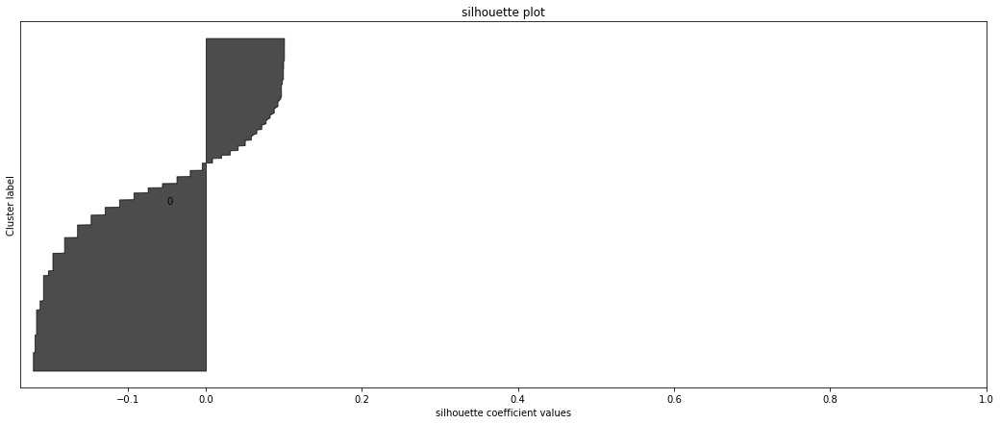

0:06:03.207016


In [0]:
# Compute the silhouette scores for each sample
start_time=datetime.datetime.now()

sample_silhouette_values = silhouette_samples(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v2_2018_loanuse'].values)

fig, (ax1) = plt.subplots(1, 1)
fig.set_size_inches(18, 7)

y_lower=10

for i in range(data['cluster_v2_2018_loanuse'].max()):
  # Aggregate the silhouette scores for samples belonging to
  # cluster i, and sort them
  ith_cluster_silhouette_values = \
  sample_silhouette_values[data['cluster_v2_2018_loanuse'] == i]

  ith_cluster_silhouette_values.sort()

  size_cluster_i = ith_cluster_silhouette_values.shape[0]
  y_upper = y_lower + size_cluster_i

  color = cm.nipy_spectral(float(i) / data['cluster_v2_2018_loanuse'].max())
  ax1.fill_betweenx(np.arange(y_lower, y_upper),0, ith_cluster_silhouette_values,facecolor=color, edgecolor=color, alpha=0.7)

  # Label the silhouette plots with their cluster numbers at the middle
  ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

  # Compute the new y_lower for next plot
  y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("silhouette plot")
ax1.set_xlabel("silhouette coefficient values")
ax1.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
#silhouette_avg = silhouette_score(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v1_2018_loanuse'])
#ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.show()

print(datetime.datetime.now()-start_time)

Text(-0.05, 785.5, '0')

Text(-0.05, 7826.0, '1')

Text(-0.05, 26773.5, '2')

Text(-0.05, 54960.5, '3')

Text(-0.05, 84346.5, '4')

Text(-0.05, 111707.5, '5')

Text(-0.05, 134147.0, '6')

Text(-0.05, 147956.0, '7')

Text(-0.05, 156158.5, '8')

Text(-0.05, 162847.5, '9')

Text(-0.05, 167280.5, '10')

Text(-0.05, 169355.0, '11')

Text(-0.05, 170858.5, '12')

Text(-0.05, 171514.0, '13')

Text(-0.05, 171720.0, '14')

Text(-0.05, 171851.0, '15')

Text(-0.05, 171923.5, '16')

Text(-0.05, 171963.5, '17')

Text(-0.05, 171988.0, '18')

Text(0.5, 1.0, 'silhouette plot')

Text(0.5, 0, 'silhouette coefficient values')

Text(0, 0.5, 'Cluster label')

[]

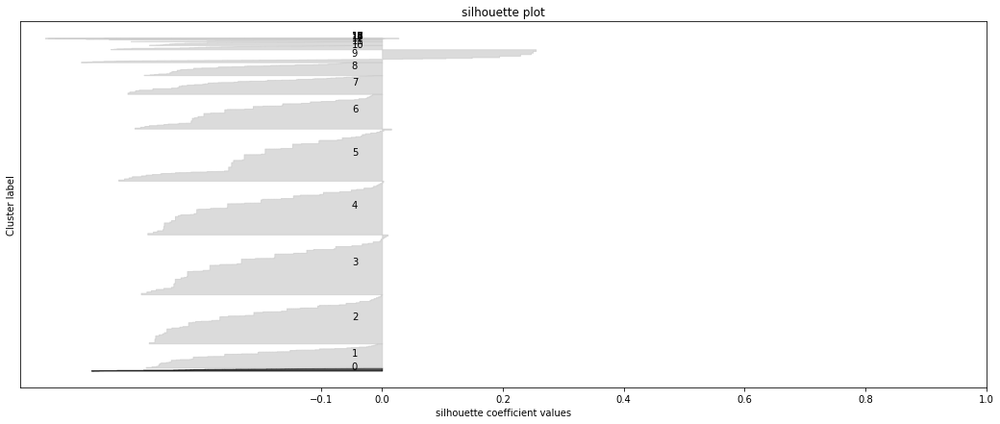

0:05:07.216820


In [0]:
# Compute the silhouette scores for each sample
start_time=datetime.datetime.now()

sample_silhouette_values = silhouette_samples(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v1_2018_loanuse'].values)

fig, (ax1) = plt.subplots(1, 1)
fig.set_size_inches(18, 7)

y_lower=10

for i in range(data['cluster_v1_2018_loanuse'].max()):
  # Aggregate the silhouette scores for samples belonging to
  # cluster i, and sort them
  ith_cluster_silhouette_values = \
  sample_silhouette_values[data['cluster_v1_2018_loanuse'] == i]

  ith_cluster_silhouette_values.sort()

  size_cluster_i = ith_cluster_silhouette_values.shape[0]
  y_upper = y_lower + size_cluster_i

  color = cm.nipy_spectral(float(i) / data['cluster_v2_2018_loanuse'].max())
  ax1.fill_betweenx(np.arange(y_lower, y_upper),0, ith_cluster_silhouette_values,facecolor=color, edgecolor=color, alpha=0.7)

  # Label the silhouette plots with their cluster numbers at the middle
  ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

  # Compute the new y_lower for next plot
  y_lower = y_upper + 10  # 10 for the 0 samples

ax1.set_title("silhouette plot")
ax1.set_xlabel("silhouette coefficient values")
ax1.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
#silhouette_avg = silhouette_score(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v1_2018_loanuse'])
#ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

ax1.set_yticks([])  # Clear the yaxis labels / ticks
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.show()

print(datetime.datetime.now()-start_time)

In [0]:
#https://gist.github.com/clintval/e9afc246e77f6488cda79f86e4d37148

import matplotlib.pyplot as plt
from kmeansplots import silhouette_plot#, kmeans_plot

#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11,4), dpi=500)
silhouette_plot(data[['N_DAYS_POSTED_RAISED']].values, data['cluster_v1_2018_loanuse'], n_clusters=data['cluster_v1_2018_loanuse'].max())#, ax=ax1)
plt.show()

Plan 5: to compare the number of words that we found common against the set of terms evaluated in the paper evaluation SVO and EVO.

not much were found in common.

### Plan 2: boxplot of time to raise the fund between clusters

only compares for loans with status funded.
alternative is perform hypothesis testing to see if the distributions are truly different.
<BR>can also be silhouette score.

In [0]:
df2018_2['cluster_v1_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T

,11,5,3,0,1,2,4,6,7,8,9,10,12,13,14,15,16,17,18,19
index,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
freq,1802,14007,28175,33927,30614,29026,19340,10656,7311,6952,2380,2037,1102,258,160,97,41,24,6,2


In [0]:
#visualize boxplot
import plotly.express as px

fig = px.box(df2018_2, x="cluster_v1_2018_loanuse", y="N_DAYS_POSTED_RAISED")
fig.show()

#observation: the clusters are too granular and the number of observations in them are not balanced. 
#therefore when we visualize the result using this, we can see that the cluster with small number of members results are not comparable to the other clusters.

In [0]:
fig = px.box(df2018_2, x="cluster_v2_2018_loanuse", y="N_DAYS_POSTED_RAISED")
fig.show()

In [0]:
#https://stackoverflow.com/questions/33575587/pandas-dataframe-how-to-apply-describe-to-each-group-and-add-to-new-columns
tmp=df2018_2[['cluster_v2_loanuse','N_DAYS_POSTED_RAISED']].copy()
pd.DataFrame(group.describe().rename(columns={'score':name}).squeeze()
                         for name, group in df.groupby('name'))

### Plan 3: boxplot amount of loans (funded and lended) between clusters

<BR>can also be silhouette score.

In [0]:
import plotly.express as px
#tips = px.data.tips()
fig = px.box(df2018_2, x="cluster_v1_loanuse", y="FUNDED_AMOUNT")
fig.show()

In [0]:
fig = px.box(df2018_2, x="cluster_v1_loanuse", y="LOAN_AMOUNT")
fig.show()

In [0]:
fig = px.box(df2018_2, x="cluster_v2_loanuse", y="FUNDED_AMOUNT", color='STATUS')
fig.show()

In [0]:
fig = px.box(df2018_2, x="cluster_v2_loanuse", y="LOAN_AMOUNT", color='STATUS')
fig.show()

### Plan 4: check cluster against status funded vs expired

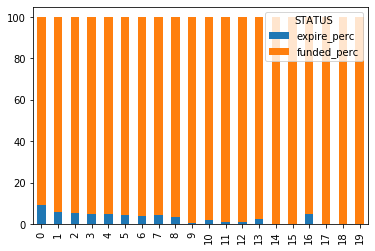

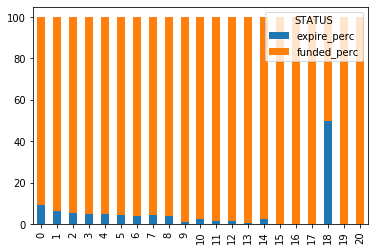

In [0]:
data=pd.crosstab(df2017_2['cluster_v1_2017_loanuse'],df2017_2['STATUS']).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
#data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

data=pd.crosstab(df2017_2['cluster_v1_2018_loanuse'],df2017_2['STATUS']).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
#data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

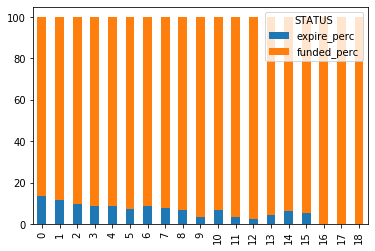

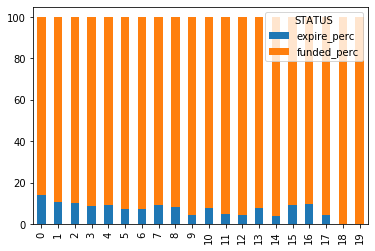

In [0]:
data=pd.crosstab(df2018_2['cluster_v1_2017_loanuse'],df2018_2['STATUS']).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
#data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

data=pd.crosstab(df2018_2['cluster_v1_2018_loanuse'],df2018_2['STATUS']).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
#data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

#the plotly charts didnt work :(

In [0]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Bar(
    y=[data['expire_perc']],
    x=[data['cluster_v1_loanuse']],
    name='expired %',
    orientation='h',
    marker=dict(
        color='rgba(246, 78, 139, 0.6)',
        line=dict(color='rgba(246, 78, 139, 1.0)', width=3)
    )
))
fig.add_trace(go.Bar(
    y=[data['funded_perc']],
    x=[data['cluster_v1_loanuse']],
    name='funded %',
    orientation='h',
    marker=dict(
        color='rgba(58, 71, 80, 0.6)',
        line=dict(color='rgba(58, 71, 80, 1.0)', width=3)
    )
))

fig.update_layout(barmode='stack')

,1,0
index,0,1
freq,2271,193804


STATUS,cluster_v2_2017_loanuse,expired,funded,expire_perc,funded_perc
0,0,210,2061,9.247028,90.752972
1,1,8867,184937,4.575241,95.424759


,1,0
index,0,1
freq,2271,193804


STATUS,cluster_v2_2018_loanuse,expired,funded,expire_perc,funded_perc
0,0,210,2061,9.247028,90.752972
1,1,8867,184937,4.575241,95.424759


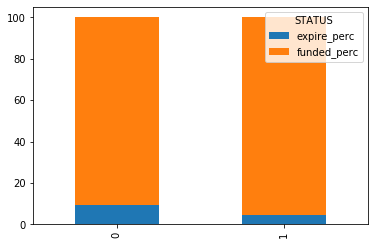

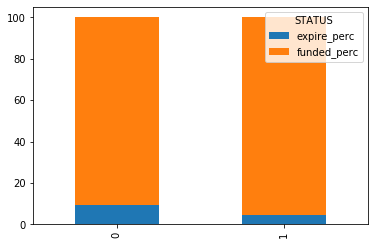

In [0]:
df2017_2['cluster_v2_2017_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T
data=pd.crosstab(df2017_2["cluster_v2_2017_loanuse"], df2017_2["STATUS"]).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

df2017_2['cluster_v2_2018_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T
data=pd.crosstab(df2017_2["cluster_v2_2018_loanuse"], df2017_2["STATUS"]).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

,1,0
index,0,1
freq,1802,186115


STATUS,cluster_v2_2017_loanuse,expired,funded,expire_perc,funded_perc
0,0,251,1551,13.928968,86.071032
1,1,15863,170252,8.523225,91.476775


,1,0
index,0,1
freq,1802,186115


STATUS,cluster_v2_2018_loanuse,expired,funded,expire_perc,funded_perc
0,0,251,1551,13.928968,86.071032
1,1,15863,170252,8.523225,91.476775


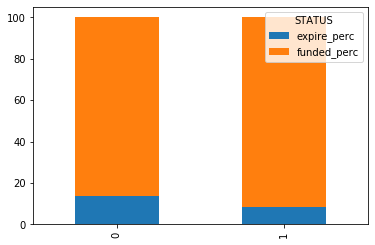

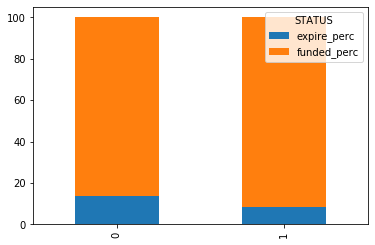

In [0]:
df2018_2['cluster_v2_2017_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T
data=pd.crosstab(df2018_2["cluster_v2_2017_loanuse"], df2018_2["STATUS"]).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

df2018_2['cluster_v2_2018_loanuse'].value_counts().reset_index(name='freq').sort_values(by='index').T
data=pd.crosstab(df2018_2["cluster_v2_2018_loanuse"], df2018_2["STATUS"]).reset_index()
data['expire_perc']=data['expired']/(data['expired']+data['funded'])*100
data['funded_perc']=data['funded']/(data['expired']+data['funded'])*100
data
data[['expire_perc','funded_perc']].plot(kind='bar', stacked=True)

## Appendix: Self defined functions